# Data Dive - 6310-D01
### By Kirollos Lewis



## Section 1: Create a folder on your computer

a) Create Data Dive folder
b) Create Data file

## Section 2: Create Jupyter Notebook

Created and renamed Notebook

## Section 3: Import Libraries and Set Defaults

In [1]:
#import and set defaults
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.core.display import display, HTML
import sklearn
from sklearn.decomposition import TruncatedSVD
from sklearn import preprocessing
from sklearn.decomposition import PCA
from PIL import Image
import glob
import zipfile
from os import path
import random
from wordcloud import WordCloud
from wordcloud import STOPWORDS
stopwords = set(STOPWORDS)
stopwords

display(HTML("<style>.container { width:95% !important; }</style>"))
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns',500) 
plt.style.use('seaborn-colorblind') 
%matplotlib inline


import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)
pd.options.mode.chained_assignment = None

In [2]:
#import and download nltk
import nltk
nltk.download()
from collections import Counter
from nltk.corpus import stopwords

showing info https://raw.githubusercontent.com/nltk/nltk_data/gh-pages/index.xml


Exception in Tkinter callback
Traceback (most recent call last):
  File "/Users/kirolloslewis/opt/anaconda3/lib/python3.8/tkinter/__init__.py", line 1880, in __call__
    try:
KeyboardInterrupt


## Section 4: Import Data

In [3]:
#Import CSV File
df_Restaurants = pd.read_csv('data/Restaurants.csv',index_col= 0, header=0)

In [4]:
#Import CSV File
df_Full_User = pd.read_csv('data/Full_User.csv',index_col= None, header=0)

In [5]:
#Import CSV File
df_Alb_Que = pd.read_csv('data/Alberta_Quebec_Reivews.csv',index_col= 0, header=0)

## Section 5: Create New DataFrame

### Section 5a: clean and explore current Dataframe

In [6]:
#Verify Column names
df_Restaurants.columns

Index(['business_id', 'name', 'address', 'city', 'state', 'postal_code',
       'latitude', 'longitude', 'stars', 'review_count', 'is_open',
       'attributes', 'categories', 'hours'],
      dtype='object')

In [7]:
#Verify Columns
df_Restaurants.head(2)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
8,pQeaRpvuhoEqudo3uymHIQ,The Empanadas House,404 E Green St,Champaign,IL,61820,40.110446,-88.233073,4.5,5,1,"{'RestaurantsAttire': ""u'casual'"", 'Restaurant...","Ethnic Food, Food Trucks, Specialty Food, Impo...","{'Monday': '11:30-14:30', 'Tuesday': '11:30-14..."
20,CsLQLiRoafpJPJSkNX2h5Q,Middle East Deli,4508 E Independence Blvd,Charlotte,NC,28205,35.194894,-80.767442,3.0,5,0,"{'RestaurantsGoodForGroups': 'True', 'OutdoorS...","Food, Restaurants, Grocery, Middle Eastern",NaN


In [8]:
#Drop Column name from Restaurant DF that we dont need 
df_Restaurants = df_Restaurants.drop(['address','postal_code','latitude','longitude','hours'],axis=1)


In [9]:
#Verify Column names
df_Full_User.columns

Index(['Unnamed: 0', 'user_id', 'name', 'review_count', 'yelping_since',
       'useful', 'funny', 'cool', 'elite', 'fans', 'average_stars',
       'compliment_hot', 'compliment_more', 'compliment_profile',
       'compliment_cute', 'compliment_list', 'compliment_note',
       'compliment_plain', 'compliment_cool', 'compliment_funny',
       'compliment_writer', 'compliment_photos'],
      dtype='object')

In [10]:
#Verify Columns
df_Full_User.head(5)

,Unnamed: 0,user_id,name,review_count,yelping_since,useful,funny,cool,elite,fans,average_stars,compliment_hot,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
0,0,---1lKK3aKOuomHnwAkAow,Monera,263,2007-06-04 01:37:45,500,180,201,"2010,2011,2012",17,3.93,2,3,2,1,0,5,9,9,9,9,0
1,1,---94vtJ_5o_nikEs6hUjg,Joe,5,2016-05-27 04:50:39,3,0,1,NaN,0,5.00,0,0,0,0,0,0,0,0,0,0,0
2,2,---PLwSf5gKdIoVnyRHgBA,Rae,3,2015-07-31 00:53:27,0,0,0,NaN,0,4.33,0,0,0,0,0,0,0,0,0,0,0
3,3,---RfKzBwQ8t3wu-LXvx3w,Jason,1,2015-11-23 14:19:04,0,0,0,NaN,0,5.00,0,0,0,0,0,0,0,0,0,0,0
4,4,---cu1hq55BP9DWVXXKHZg,Jack,66,2009-04-18 23:10:01,134,54,24,NaN,0,3.70,0,0,0,0,0,3,2,0,0,0,0


In [11]:
#Drop Column name from Restaurant DF that we dont need 
df_Full_User = df_Full_User.drop(['Unnamed: 0','name','review_count','yelping_since','elite','fans','compliment_hot','compliment_more','compliment_profile',
'compliment_cute', 'compliment_list', 'compliment_note','compliment_plain', 'compliment_cool', 'compliment_funny',
       'compliment_writer','compliment_photos','useful','funny','cool'],axis=1)

In [12]:
#Verify Column names
df_Alb_Que.columns

Index(['business_id', 'name', 'review_id', 'user_id', 'stars', 'useful',
       'funny', 'cool', 'text', 'date'],
      dtype='object')

In [13]:
#Verify Columns
df_Alb_Que.head(2)

,business_id,name,review_id,user_id,stars,useful,funny,cool,text,date
0,LoRef3ChgZKbxUio-sHgQg,Amir,2L1UbgcrQSTNObqZEufKKw,schfOYW71VamTTdfzqDlXQ,2.0,1.0,0.0,0.0,"Good food, terrible customer service. For me ...",2013-05-29 16:24:17
1,LoRef3ChgZKbxUio-sHgQg,Amir,IX0aVU1k6ZcB-xMUw9IhRQ,qKpkRCPk4ycbllTfFcRbNw,3.0,0.0,0.0,0.0,Just another nice Amir food nothing more but r...,2016-05-21 01:17:33


In [14]:
#Drop Column name from Restaurant DF that we dont need 
df_Alb_Que = df_Alb_Que.drop(['review_id','name'],axis=1)

In [15]:
#Combine city and State columns
df_Restaurants["Location"]= df_Restaurants["city"]+ ", "+df_Restaurants["state"]

In [16]:
df_Restaurants.head(2)

,business_id,name,city,state,stars,review_count,is_open,attributes,categories,Location
8,pQeaRpvuhoEqudo3uymHIQ,The Empanadas House,Champaign,IL,4.5,5,1,"{'RestaurantsAttire': ""u'casual'"", 'Restaurant...","Ethnic Food, Food Trucks, Specialty Food, Impo...","Champaign, IL"
20,CsLQLiRoafpJPJSkNX2h5Q,Middle East Deli,Charlotte,NC,3.0,5,0,"{'RestaurantsGoodForGroups': 'True', 'OutdoorS...","Food, Restaurants, Grocery, Middle Eastern","Charlotte, NC"


In [17]:
#Drop Columns city and state
df_Restaurants = df_Restaurants.drop(['city','state'],axis=1)

In [18]:
#Rename columns 
df_Restaurants.rename(columns = {'stars':'Chain_Avg_Stars'}, inplace=True)
df_Full_User.rename(columns= {'average_stars':'Avg_stars_user'},inplace = True)

### Section 5b: create df_rest_reviews

In [19]:
#first step to create new df using merge
df_rest_reviews= pd.merge(df_Restaurants, df_Alb_Que, on='business_id', how='right')

In [20]:
#check new df info
df_rest_reviews.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 233040 entries, 0 to 233039
Data columns (total 15 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   business_id      233040 non-null  object 
 1   name             233040 non-null  object 
 2   Chain_Avg_Stars  233040 non-null  float64
 3   review_count     233040 non-null  int64  
 4   is_open          233040 non-null  int64  
 5   attributes       230959 non-null  object 
 6   categories       233040 non-null  object 
 7   Location         233040 non-null  object 
 8   user_id          233040 non-null  object 
 9   stars            233040 non-null  float64
 10  useful           233040 non-null  float64
 11  funny            233040 non-null  float64
 12  cool             233040 non-null  float64
 13  text             233040 non-null  object 
 14  date             233040 non-null  object 
dtypes: float64(5), int64(2), object(8)
memory usage: 28.4+ MB


In [21]:
#Verify new df head
df_rest_reviews.head()

,business_id,name,Chain_Avg_Stars,review_count,is_open,attributes,categories,Location,user_id,stars,useful,funny,cool,text,date
0,LoRef3ChgZKbxUio-sHgQg,Amir,3.0,18,1,"{'RestaurantsAttire': ""u'casual'"", 'Restaurant...","Restaurants, Lebanese, Middle Eastern","Montréal, QC",schfOYW71VamTTdfzqDlXQ,2.0,1.0,0.0,0.0,"Good food, terrible customer service. For me ...",2013-05-29 16:24:17
1,LoRef3ChgZKbxUio-sHgQg,Amir,3.0,18,1,"{'RestaurantsAttire': ""u'casual'"", 'Restaurant...","Restaurants, Lebanese, Middle Eastern","Montréal, QC",qKpkRCPk4ycbllTfFcRbNw,3.0,0.0,0.0,0.0,Just another nice Amir food nothing more but r...,2016-05-21 01:17:33
2,LoRef3ChgZKbxUio-sHgQg,Amir,3.0,18,1,"{'RestaurantsAttire': ""u'casual'"", 'Restaurant...","Restaurants, Lebanese, Middle Eastern","Montréal, QC",nobMBDhkieDUZHCBXHmQ8w,2.0,0.0,0.0,0.0,Small portions and expensive. There was so lit...,2016-03-20 01:58:56
3,LoRef3ChgZKbxUio-sHgQg,Amir,3.0,18,1,"{'RestaurantsAttire': ""u'casual'"", 'Restaurant...","Restaurants, Lebanese, Middle Eastern","Montréal, QC",iwDP-y8NJG3Vem2z242LDg,1.0,5.0,2.0,1.0,I only ever eat at three of the millions of Am...,2013-12-10 20:24:01
4,LoRef3ChgZKbxUio-sHgQg,Amir,3.0,18,1,"{'RestaurantsAttire': ""u'casual'"", 'Restaurant...","Restaurants, Lebanese, Middle Eastern","Montréal, QC",0TJ01iwzVLXtr_EYcfqoWQ,3.0,0.0,0.0,0.0,It's similar to other branches of the chain. \...,2015-10-21 02:38:56


In [22]:
#second step to create new df using an outer merge
df_rest_reviews = pd.merge(df_rest_reviews, df_Full_User, on='user_id', how='inner')

In [23]:
#verify info
df_rest_reviews.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 233040 entries, 0 to 233039
Data columns (total 16 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   business_id      233040 non-null  object 
 1   name             233040 non-null  object 
 2   Chain_Avg_Stars  233040 non-null  float64
 3   review_count     233040 non-null  int64  
 4   is_open          233040 non-null  int64  
 5   attributes       230959 non-null  object 
 6   categories       233040 non-null  object 
 7   Location         233040 non-null  object 
 8   user_id          233040 non-null  object 
 9   stars            233040 non-null  float64
 10  useful           233040 non-null  float64
 11  funny            233040 non-null  float64
 12  cool             233040 non-null  float64
 13  text             233040 non-null  object 
 14  date             233040 non-null  object 
 15  Avg_stars_user   233040 non-null  float64
dtypes: float64(6), int64(2), object(8)
mem

In [24]:
#verify new d head
df_rest_reviews.head(2)

,business_id,name,Chain_Avg_Stars,review_count,is_open,attributes,categories,Location,user_id,stars,useful,funny,cool,text,date,Avg_stars_user
0,LoRef3ChgZKbxUio-sHgQg,Amir,3.0,18,1,"{'RestaurantsAttire': ""u'casual'"", 'Restaurant...","Restaurants, Lebanese, Middle Eastern","Montréal, QC",schfOYW71VamTTdfzqDlXQ,2.0,1.0,0.0,0.0,"Good food, terrible customer service. For me ...",2013-05-29 16:24:17,2.92
1,3GHmr2HY9AoEtYDRbE0ZcQ,Shawarma Station,3.5,29,1,"{'RestaurantsTakeOut': 'True', 'Alcohol': ""u'n...","Mediterranean, Greek, Restaurants, Middle Eastern","Calgary, AB",schfOYW71VamTTdfzqDlXQ,1.0,0.0,0.0,0.0,We ordered this on skip this dishes. This was...,2019-11-30 05:25:34,2.92


In [25]:
#drop rows containing missing attributes 
df_rest_reviews.dropna(subset=["attributes"], inplace=True)

In [26]:
df_rest_reviews['categories'].value_counts()

Sandwiches, Specialty Food, Restaurants, Food, Cheese Shops, Imported Food, Delis, Ethnic Food    2698
Chinese, Restaurants                                                                              2289
Restaurants, Breakfast & Brunch                                                                   2268
Restaurants, French                                                                               2201
Vietnamese, Restaurants                                                                           2192
                                                                                                  ... 
Food, Restaurants, Cafes, Desserts                                                                   3
Food, Bakeries, Middle Eastern, Specialty Food, Lebanese, Mediterranean, Restaurants, Desserts       3
Patisserie/Cake Shop, Food, Restaurants, Bakeries, Kosher                                            3
American (Traditional), Restaurants, Fast Food, Chicken Shop, Chicken Win

### Section 5c: Create df_rest_chinese

In [27]:
#convert to lower case so that we don't miss any cases when we filter
df_rest_reviews["categories"]=df_rest_reviews["categories"].str.lower()

In [28]:
#Filter for chinese restaurants
df_chinese_reviews=(df_rest_reviews[df_rest_reviews['categories'].str.contains("chinese")])

In [29]:
#check info
df_chinese_reviews.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13158 entries, 15 to 232709
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   business_id      13158 non-null  object 
 1   name             13158 non-null  object 
 2   Chain_Avg_Stars  13158 non-null  float64
 3   review_count     13158 non-null  int64  
 4   is_open          13158 non-null  int64  
 5   attributes       13158 non-null  object 
 6   categories       13158 non-null  object 
 7   Location         13158 non-null  object 
 8   user_id          13158 non-null  object 
 9   stars            13158 non-null  float64
 10  useful           13158 non-null  float64
 11  funny            13158 non-null  float64
 12  cool             13158 non-null  float64
 13  text             13158 non-null  object 
 14  date             13158 non-null  object 
 15  Avg_stars_user   13158 non-null  float64
dtypes: float64(6), int64(2), object(8)
memory usage: 1.7+ MB

In [30]:
df_chinese_reviews['stars'].value_counts()

4.0    4372
5.0    3828
3.0    2086
1.0    1698
2.0    1174
Name: stars, dtype: int64

In [31]:
df_chinese_reviews['date'].value_counts()

2013-05-14 16:51:06    2
2012-10-11 23:20:35    2
2017-05-18 18:54:47    1
2018-02-12 19:44:17    1
2015-01-07 22:25:40    1
                      ..
2017-12-11 00:02:03    1
2018-06-16 04:47:49    1
2016-04-05 01:42:26    1
2019-02-14 00:11:39    1
2018-06-13 21:27:42    1
Name: date, Length: 13156, dtype: int64

### Subsection 5c: Create df_chinese_rev_5

In [32]:
#Filter for only 5 star reviews
df_chinese_rev_5=df_chinese_reviews.loc[(df_chinese_reviews['stars']==5.0)]
df_chinese_rev_5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3828 entries, 102 to 232709
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   business_id      3828 non-null   object 
 1   name             3828 non-null   object 
 2   Chain_Avg_Stars  3828 non-null   float64
 3   review_count     3828 non-null   int64  
 4   is_open          3828 non-null   int64  
 5   attributes       3828 non-null   object 
 6   categories       3828 non-null   object 
 7   Location         3828 non-null   object 
 8   user_id          3828 non-null   object 
 9   stars            3828 non-null   float64
 10  useful           3828 non-null   float64
 11  funny            3828 non-null   float64
 12  cool             3828 non-null   float64
 13  text             3828 non-null   object 
 14  date             3828 non-null   object 
 15  Avg_stars_user   3828 non-null   float64
dtypes: float64(6), int64(2), object(8)
memory usage: 508.4+ 

### Subsection 5d: Create df_chinese_rev_1

In [33]:
#Filter for only 1 star reviews
df_chinese_rev_1=df_chinese_reviews.loc[(df_chinese_reviews['stars']==1.0)]
df_chinese_rev_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1698 entries, 617 to 232708
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   business_id      1698 non-null   object 
 1   name             1698 non-null   object 
 2   Chain_Avg_Stars  1698 non-null   float64
 3   review_count     1698 non-null   int64  
 4   is_open          1698 non-null   int64  
 5   attributes       1698 non-null   object 
 6   categories       1698 non-null   object 
 7   Location         1698 non-null   object 
 8   user_id          1698 non-null   object 
 9   stars            1698 non-null   float64
 10  useful           1698 non-null   float64
 11  funny            1698 non-null   float64
 12  cool             1698 non-null   float64
 13  text             1698 non-null   object 
 14  date             1698 non-null   object 
 15  Avg_stars_user   1698 non-null   float64
dtypes: float64(6), int64(2), object(8)
memory usage: 225.5+ 

### Subsection 5e: Create text strings for content

In [34]:
#Convert 5 stars to text
text_5 = df_chinese_rev_5['text']
type(text_5)
text_5

102       J'adore la place, petit local mais efficace se...
668       I discovered this place when I attended a conf...
914       I got the waitress's fav w a side wonton and i...
1007      I think this is the best hotpot in the city at...
1085      Yes, yes, yes. I tried 3 varieties of dumpling...
                                ...                        
232365    First time try their food, amazing!!! Ginger b...
232366    I love there ginger Beef it awesome and you ge...
232392    Attentive service, open very late, the food ca...
232394    Such an authentic Chinese restaurant! I moved ...
232709    Great little spot with awesome noodles and oth...
Name: text, Length: 3828, dtype: object

In [35]:
#convert 5 stars to all one text 
ch_text_reviews_5 = text_5.to_string()
display(type(ch_text_reviews_5))
ch_text_reviews_5

str

'102       J\'adore la place, petit local mais efficace se...\n668       I discovered this place when I attended a conf...\n914       I got the waitress\'s fav w a side wonton and i...\n1007      I think this is the best hotpot in the city at...\n1085      Yes, yes, yes. I tried 3 varieties of dumpling...\n1207      Came here by accident and left super happy!\\n\\...\n1220      A top choice for yummy food, good prices and s...\n1577      Please note that I am writing this review for ...\n1697      Coming from California, I wasn\'t sure if Vua c...\n1707      Authentic Yunnan rice noodles in Montreal! You...\n1756      As authentic as it gets! This newly opened lit...\n1765      M. Trois now serves authentic Szechuan hot pot...\n1864      I\'ve been going to Jatoba pretty regularly for...\n2015      My boyfriend and I got the steamed pork buns t...\n2061      Awesome after a night of drinking till 3 am or...\n2195      SO happy this restaurant opened up next to me....\n2351      Yum yum

In [36]:
#Convert 1 stars to text
text_1 = df_chinese_rev_1['text']
type(text_1)
text_1

617       Delicious egg rolls. Not the same quality as t...
966       I couldn't agree more with Sabrina L. \nThe fo...
1811      I was really looking forward to eating here, b...
4514      Service exécrable : la serveuse était surprise...
4700      On our way to Kanbai we decided to try Wok Caf...
                                ...                        
232390    I don't know if it was because that I am from ...
232391    Really bad restaurant, the one star is just fo...
232395    If I could give this less than a 1 star I woul...
232470    This isn't food.\n\nThe ordering system is ult...
232708    Was in Chinatown today and saw pastor from chu...
Name: text, Length: 1698, dtype: object

In [37]:
#convert 1 stars to all contiuous text 
ch_text_reviews_1 = text_1.to_string()
display(type(ch_text_reviews_1))
ch_text_reviews_1

str

'617       Delicious egg rolls. Not the same quality as t...\n966       I couldn\'t agree more with Sabrina L. \\nThe fo...\n1811      I was really looking forward to eating here, b...\n4514      Service exécrable : la serveuse était surprise...\n4700      On our way to Kanbai we decided to try Wok Caf...\n5068      Came here with my fiancee. We were told that t...\n5098      I only go here because my mom likes this resta...\n5592      We came for dim sum on a Sunday morning and af...\n6055      This place is a new restaurant Hong Kong style...\n6061      If I can give 0 star i can say 1 star is too m...\n6063      I just order one soup for take out....it\'s ove...\n6079      Food is not good....can not compare with kanba...\n6083      Je viens de commander dumpings fried au beoef ...\n6379      Thats a bad sushi place, i ate at hundreds of ...\n7423      I can\'t imagine actually planning to go to Sin...\n7424      I have posted this review anonymously before b...\n7438      Another p

### Section 6: Create a Wordcloud 

### Subsection 6a: Wordcloud for 5 stars

In [38]:
#create a wordcloud for 5 star reviews
stopwords = set(STOPWORDS)
wc = WordCloud(stopwords=stopwords, margin=10, background_color="black").generate(ch_text_reviews_5)

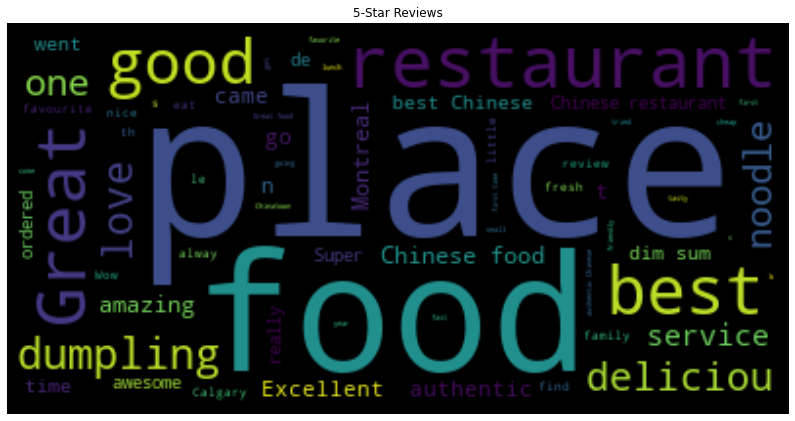

In [39]:
#Display wordcloud
default_colors = wc.to_array()
plt.figure(figsize=(14,12))
plt.title("5-Star Reviews")
plt.imshow(default_colors, interpolation="bilinear")
plt.axis("off")
plt.show()

### Subsection 6b: Wordcloud for 1 stars

In [40]:
#create a wordcloud for 1 star reviews
stopwords = set(STOPWORDS)
wc_1 = WordCloud(stopwords=stopwords, margin=10, background_color="black").generate(ch_text_reviews_1)

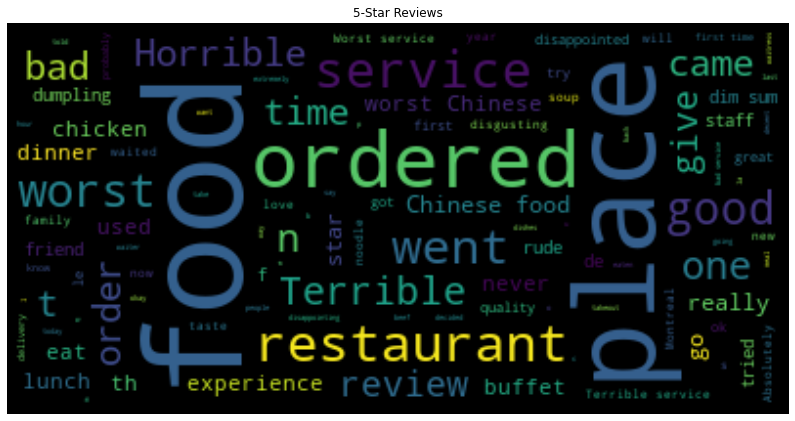

In [41]:
#Display wordcloud
default_colors = wc_1.to_array()
plt.figure(figsize=(14,12))
plt.title("5-Star Reviews")
plt.imshow(default_colors, interpolation="bilinear")
plt.axis("off")
plt.show()

## Section 7: Create n-grams for 5-star reviews

### Subsection 7a: Create Counter for 5-star Reviews

In [42]:
#import stopwords from nltk
from nltk.corpus import stopwords
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/kirolloslewis/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [43]:
#seta variable to stopwords
cachedStopWords = set(stopwords.words("english")+ stopwords.words("French"))
cachedStopWords

{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ai',
 'aie',
 'aient',
 'aies',
 'ain',
 'ait',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'au',
 'aura',
 'aurai',
 'auraient',
 'aurais',
 'aurait',
 'auras',
 'aurez',
 'auriez',
 'aurions',
 'aurons',
 'auront',
 'aux',
 'avaient',
 'avais',
 'avait',
 'avec',
 'avez',
 'aviez',
 'avions',
 'avons',
 'ayant',
 'ayante',
 'ayantes',
 'ayants',
 'ayez',
 'ayons',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'c',
 'can',
 'ce',
 'ces',
 'couldn',
 "couldn't",
 'd',
 'dans',
 'de',
 'des',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'du',
 'during',
 'each',
 'elle',
 'en',
 'es',
 'est',
 'et',
 'eu',
 'eue',
 'eues',
 'eurent',
 'eus',
 'eusse',
 'eussent',
 'eusses',
 'eussiez',
 'eussions',
 'eut',
 'eux',
 'eûmes',
 'eût',
 'eûtes',
 'few',
 'for',
 'from',
 'furent',
 'furth

In [44]:
#tokenize text for 5 stars
tokens_5 = [w for w in nltk.word_tokenize(ch_text_reviews_5.lower())
 if w.isalpha()]

In [45]:
#remove new stop words
no_stops_5 = [t for t in tokens_5
 if t not in cachedStopWords]

In [46]:
#show 20 most common words
Counter(no_stops_5).most_common(20)

[('food', 557),
 ('place', 544),
 ('best', 364),
 ('chinese', 356),
 ('great', 332),
 ('restaurant', 315),
 ('good', 238),
 ('love', 201),
 ('dumplings', 190),
 ('service', 162),
 ('delicious', 146),
 ('amazing', 144),
 ('authentic', 132),
 ('one', 129),
 ('montreal', 122),
 ('excellent', 112),
 ('noodles', 108),
 ('time', 103),
 ('really', 94),
 ('ever', 91)]

In [47]:
#update stopwords
cachedStopWords.update(('one','really','ever','chinese','restaurant','go','came','give','place','star','zero'))

In [48]:
#remove new stop words
no_stops_5 = [t for t in tokens_5
 if t not in cachedStopWords]

In [49]:
#show new 20 most common words
Counter(no_stops_5).most_common(20)

[('food', 557),
 ('best', 364),
 ('great', 332),
 ('good', 238),
 ('love', 201),
 ('dumplings', 190),
 ('service', 162),
 ('delicious', 146),
 ('amazing', 144),
 ('authentic', 132),
 ('montreal', 122),
 ('excellent', 112),
 ('noodles', 108),
 ('time', 103),
 ('first', 88),
 ('dim', 83),
 ('soup', 80),
 ('sum', 79),
 ('went', 77),
 ('like', 72)]

In [50]:
#Import 
from nltk.util import ngrams

In [51]:
#create a bigram
bigrams = ngrams(no_stops_5, 2)
Counter(bigrams).most_common(20)

[(('dim', 'sum'), 77),
 (('great', 'food'), 56),
 (('food', 'great'), 43),
 (('best', 'food'), 42),
 (('first', 'time'), 41),
 (('best', 'dumplings'), 34),
 (('hidden', 'gem'), 29),
 (('great', 'service'), 28),
 (('good', 'food'), 26),
 (('delicious', 'food'), 24),
 (('amazing', 'food'), 23),
 (('food', 'good'), 18),
 (('authentic', 'food'), 18),
 (('love', 'love'), 18),
 (('hot', 'pot'), 17),
 (('excellent', 'food'), 17),
 (('every', 'time'), 16),
 (('probably', 'best'), 15),
 (('best', 'thai'), 15),
 (('thai', 'food'), 15)]

### Section 7b: Create a counter using lemmatizing for 5-star reviews

In [52]:
#import lemmatizer
from nltk.stem import WordNetLemmatizer

In [53]:
#create lemmatized_5
wordnet_lemmatizer = WordNetLemmatizer()
lemmatized_5 = [wordnet_lemmatizer.lemmatize(t) for t in no_stops_5]

In [54]:
#create counter
text_bow_5 = Counter(lemmatized_5)
text_bow_5.most_common(20)

[('food', 559),
 ('best', 364),
 ('great', 332),
 ('dumpling', 248),
 ('good', 238),
 ('love', 205),
 ('noodle', 177),
 ('service', 166),
 ('time', 154),
 ('delicious', 146),
 ('amazing', 144),
 ('authentic', 132),
 ('montreal', 122),
 ('excellent', 112),
 ('first', 88),
 ('soup', 86),
 ('dim', 83),
 ('sum', 79),
 ('went', 77),
 ('like', 73)]

In [55]:
#create text chart
text_chart_5 = pd.DataFrame(text_bow_5.most_common(20), columns = ['word', 'freq'])
text_chart_5

,word,freq
0,food,559
1,best,364
2,great,332
3,dumpling,248
4,good,238
5,love,205
6,noodle,177
7,service,166
8,time,154
9,delicious,146


In [56]:
#create bi-gram
bigrams_lem_5 = ngrams(lemmatized_5, 2)
Counter(bigrams_lem_5).most_common(20)

[(('dim', 'sum'), 77),
 (('great', 'food'), 56),
 (('best', 'dumpling'), 44),
 (('food', 'great'), 43),
 (('best', 'food'), 42),
 (('first', 'time'), 41),
 (('hidden', 'gem'), 30),
 (('great', 'service'), 28),
 (('good', 'food'), 26),
 (('delicious', 'food'), 24),
 (('amazing', 'food'), 23),
 (('noodle', 'soup'), 19),
 (('soup', 'dumpling'), 19),
 (('food', 'good'), 18),
 (('authentic', 'food'), 18),
 (('best', 'noodle'), 18),
 (('love', 'love'), 18),
 (('hot', 'pot'), 17),
 (('excellent', 'food'), 17),
 (('every', 'time'), 16)]

In [57]:
#create trigram
trigrams_lem_5 = ngrams(lemmatized_5, 3)
Counter(trigrams_lem_5).most_common(20)

[(('great', 'food', 'great'), 16),
 (('food', 'great', 'service'), 12),
 (('best', 'dim', 'sum'), 9),
 (('hand', 'pulled', 'noodle'), 9),
 (('best', 'thai', 'food'), 9),
 (('general', 'tao', 'chicken'), 8),
 (('love', 'love', 'love'), 8),
 (('great', 'dim', 'sum'), 8),
 (('xiao', 'long', 'bao'), 7),
 (('excellent', 'dim', 'sum'), 6),
 (('best', 'food', 'calgary'), 6),
 (('food', 'great', 'price'), 6),
 (('yum', 'yum', 'yum'), 5),
 (('dim', 'sum', 'good'), 5),
 (('favourite', 'dim', 'sum'), 5),
 (('best', 'dumpling', 'town'), 5),
 (('beef', 'noodle', 'soup'), 4),
 (('service', 'good', 'food'), 4),
 (('hong', 'kong', 'style'), 4),
 (('authentic', 'hand', 'pulled'), 4)]

In [58]:
#create quadgram
quadgrams_lem_5 = ngrams(lemmatized_5, 4)
Counter(quadgrams_lem_5).most_common(20)

[(('great', 'food', 'great', 'service'), 7),
 (('great', 'food', 'great', 'price'), 6),
 (('yum', 'yum', 'yum', 'yum'), 4),
 (('best', 'thai', 'food', 'calgary'), 4),
 (('best', 'general', 'tao', 'chicken'), 3),
 (('dumpling', 'xiao', 'long', 'bao'), 3),
 (('best', 'montreal', 'spicy', 'fish'), 2),
 (('food', 'absolutely', 'amazing', 'food'), 2),
 (('oh', 'damn', 'best', 'food'), 2),
 (('damn', 'best', 'food', 'east'), 2),
 (('best', 'food', 'east', 'snake'), 2),
 (('food', 'east', 'snake', 'r'), 2),
 (('best', 'pho', 'montreal', 'far'), 2),
 (('feel', 'like', 'eating', 'food'), 2),
 (('like', 'eating', 'food', 'court'), 2),
 (('eating', 'food', 'court', 'food'), 2),
 (('food', 'court', 'food', 'w'), 2),
 (('hidden', 'gem', 'look', 'like'), 2),
 (('excellent', 'dim', 'sum', 'spot'), 2),
 (('dim', 'sum', 'spot', 'want'), 2)]

### Section 7c: Explain the results for the n-grams for the 5-star reviews
using markdown explain what you see from the results from the different n-grams.
   
   - Anything interesting jump out at you?
   - Are there any words or phrases that you would like to learn more about?

## Section 8: Create n-grams for 1-star reviews

### Section 8a: Create a counter for 1-star reviews

In [59]:
#import stopwords from nltk - commented out because step was completed previously
#from nltk.corpus import stopwords
#nltk.download('stopwords')
#set variables to stopwords done above

In [60]:
#tokenize text
tokens_1 = [w for w in nltk.word_tokenize(ch_text_reviews_1.lower())
 if w.isalpha()]

In [61]:
#remove new stop words
no_stops_1 = [t for t in tokens_1
 if t not in cachedStopWords]

In [62]:
#show 20 most common words
Counter(no_stops_1).most_common(20)

[('food', 311),
 ('service', 168),
 ('worst', 138),
 ('ordered', 126),
 ('went', 88),
 ('good', 79),
 ('terrible', 72),
 ('bad', 66),
 ('horrible', 59),
 ('time', 54),
 ('order', 47),
 ('would', 39),
 ('first', 36),
 ('used', 34),
 ('chicken', 33),
 ('experience', 33),
 ('like', 33),
 ('th', 33),
 ('could', 32),
 ('never', 32)]

In [63]:
#create a bigram
bigrams = ngrams(no_stops_1, 2)
Counter(bigrams).most_common(20)

[(('worst', 'food'), 39),
 (('dim', 'sum'), 22),
 (('worst', 'service'), 21),
 (('terrible', 'service'), 20),
 (('food', 'good'), 18),
 (('first', 'time'), 17),
 (('bad', 'service'), 11),
 (('ordered', 'delivery'), 11),
 (('horrible', 'service'), 11),
 (('probably', 'worst'), 11),
 (('customer', 'service'), 10),
 (('could', 'stars'), 10),
 (('service', 'bad'), 10),
 (('stars', 'would'), 10),
 (('general', 'tao'), 9),
 (('terrible', 'food'), 9),
 (('ordered', 'food'), 9),
 (('food', 'horrible'), 9),
 (('decided', 'try'), 8),
 (('ordered', 'take'), 8)]

### Section 8b: Create a counter using lemmatizing for 1-star reviews

In [64]:
#create lemmatized_1
wordnet_lemmatizer = WordNetLemmatizer()
lemmatized_1 = [wordnet_lemmatizer.lemmatize(t) for t in no_stops_1]

In [65]:
#create counter
text_bow_1 = Counter(lemmatized_1)
text_bow_1.most_common(20)

[('food', 314),
 ('service', 174),
 ('worst', 138),
 ('ordered', 126),
 ('went', 88),
 ('time', 81),
 ('good', 79),
 ('terrible', 72),
 ('bad', 66),
 ('horrible', 59),
 ('order', 47),
 ('review', 42),
 ('would', 39),
 ('first', 36),
 ('experience', 35),
 ('like', 34),
 ('used', 34),
 ('chicken', 33),
 ('th', 33),
 ('could', 32)]

In [66]:
text_chart_1 = pd.DataFrame(text_bow_1.most_common(20), columns = ['word', 'freq'])
text_chart_1

,word,freq
0,food,314
1,service,174
2,worst,138
3,ordered,126
4,went,88
5,time,81
6,good,79
7,terrible,72
8,bad,66
9,horrible,59


In [67]:
bigrams_lem_1 = ngrams(lemmatized_1, 2)
Counter(bigrams_lem_1).most_common(20)

[(('worst', 'food'), 39),
 (('dim', 'sum'), 23),
 (('worst', 'service'), 21),
 (('terrible', 'service'), 20),
 (('food', 'good'), 18),
 (('first', 'time'), 17),
 (('bad', 'service'), 12),
 (('ordered', 'delivery'), 11),
 (('horrible', 'service'), 11),
 (('probably', 'worst'), 11),
 (('customer', 'service'), 10),
 (('could', 'star'), 10),
 (('service', 'bad'), 10),
 (('star', 'would'), 10),
 (('general', 'tao'), 9),
 (('service', 'terrible'), 9),
 (('terrible', 'food'), 9),
 (('ordered', 'food'), 9),
 (('food', 'horrible'), 9),
 (('decided', 'try'), 8)]

In [68]:
#create trigram
trigrams_lem_1 = ngrams(lemmatized_1, 3)
Counter(trigrams_lem_1).most_common(20)

[(('could', 'star', 'would'), 7),
 (('worst', 'dim', 'sum'), 5),
 (('food', 'bad', 'service'), 4),
 (('absolutely', 'worst', 'food'), 4),
 (('chicken', 'fried', 'rice'), 4),
 (('worst', 'customer', 'service'), 3),
 (('hot', 'sour', 'soup'), 3),
 (('let', 'start', 'saying'), 3),
 (('food', 'horrible', 'service'), 3),
 (('service', 'bad', 'food'), 3),
 (('worst', 'service', 'food'), 3),
 (('bad', 'customer', 'service'), 3),
 (('general', 'tao', 'chicken'), 3),
 (('got', 'sick', 'eating'), 3),
 (('went', 'friday', 'night'), 3),
 (('probably', 'worst', 'food'), 3),
 (('food', 'good', 'service'), 3),
 (('good', 'food', 'bad'), 2),
 (('hainan', 'chicken', 'rice'), 2),
 (('beware', 'dead', 'fish'), 2)]

In [69]:
#create quadgram
quadgrams_lem_1 = ngrams(lemmatized_1, 4)
Counter(quadgrams_lem_1).most_common(20)

[(('month', 'later', 'read', 'comment'), 2),
 (('never', 'truly', 'fan', 'chez'), 2),
 (('truly', 'fan', 'chez', 'cora'), 2),
 (('très', 'déçue', 'arrivée', 'lunch'), 2),
 (('déçue', 'arrivée', 'lunch', 'vers'), 2),
 (('ordered', 'hot', 'sour', 'soup'), 2),
 (('service', 'bad', 'good', 'thing'), 2),
 (('bad', 'good', 'thing', 'tha'), 2),
 (('several', 'good', 'meal', 'past'), 2),
 (('good', 'meal', 'past', 'coup'), 2),
 (('ordered', 'chicken', 'chow', 'mein'), 2),
 (('went', 'walk', 'bar', 'ask'), 2),
 (('walk', 'bar', 'ask', 'f'), 2),
 (('ok', 'food', 'bad', 'service'), 2),
 (('ordered', 'take', 'tonight', 'yankee'), 2),
 (('take', 'tonight', 'yankee', 'gam'), 2),
 (('yup', 'definitely', 'gone', 'crap'), 2),
 (('delicious', 'egg', 'roll', 'quality'), 1),
 (('egg', 'roll', 'quality', 'could'), 1),
 (('roll', 'quality', 'could', 'agree'), 1)]

### Section 8b: Explain the results for the n-grams for 1-star reviews

## Section 9: Analyze the results for 5-star and 1-star

### Section 9a: Why is snake and why déçue?

In [70]:
#create new DF and filter for Brizzy
pd.set_option('display.max_colwidth', -1)
df_rest_reviews_content = df_rest_reviews[['name','Chain_Avg_Stars','attributes','text','stars']]
df_rest_reviews_content.loc[df_rest_reviews_content['text'].str.contains("snake", na=False)]

,name,Chain_Avg_Stars,attributes,text,stars
1314,Xin Jing Hua Dimsum Restaurant,3.0,"{'RestaurantsDelivery': 'False', 'RestaurantsGoodForGroups': 'False', 'BusinessParking': ""{'garage': False, 'street': False, 'validated': False, 'lot': False, 'valet': False}""}","We usually mark the Chinese new year by going in Chinatown and eating some Dim Sum. As you probably guess, we are not the only ones doing that and it can be a challenge to have seats in restaurants. This year, we decided to head to Brossard as there is now a larger Chinese community there than in Montreal's Chinatown.\n\nThere is a few large Dim Sum places on bld Taschereau and we decided to try this lesser known one hoping there is going to be less wait. As expected, the place (quite large but not as much as some in Chinatown) was quite full, yet we were lucky enough to get a seat right away. Also, we noticed that there is quite a bit of turnover so people coming in didn't had to wait a lot either. The clientele was mostly Chinese and the servers did call out the Sim Sum choices in mandarin. \n\nService was quite fast as there was a number of server passing by with Dim Sum selections and the choice have seemed better than other places in Montreal. It was quite good and prices were quite reasonable as well.\n\nAn extra advantage of the suburb is free parking. All in all, we were happy to have come here for our Chinese New Year 2013, year of the snake.",4.0
2148,Cacao 70,4.0,"{'RestaurantsDelivery': 'False', 'Caters': 'False', 'RestaurantsReservations': 'True', 'BikeParking': 'True', 'OutdoorSeating': 'False', 'RestaurantsAttire': ""u'casual'"", 'HasTV': 'False', 'GoodForKids': 'True', 'RestaurantsGoodForGroups': 'True', 'RestaurantsTakeOut': 'True', 'RestaurantsPriceRange2': '2', 'RestaurantsTableService': 'True', 'Ambience': ""{'romantic': False, 'intimate': False, 'classy': False, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': False, 'casual': True}"", 'Alcohol': ""u'beer_and_wine'"", 'BusinessParking': ""{'garage': False, 'street': True, 'validated': False, 'lot': False, 'valet': False}"", 'GoodForMeal': ""{'dessert': True, 'latenight': False, 'lunch': False, 'dinner': False, 'brunch': True, 'breakfast': False}"", 'NoiseLevel': ""u'average'"", 'WiFi': ""u'free'"", 'ByAppointmentOnly': 'False'}","If you're craving dessert, specifically decadent, good quality chocolate fondue, hot chocolate, and inventive waffle creations, Cacao 70 is the remedy. I think I've been here 10 times!\n\nAfter checking out their new menu, my sister and friend ordered American-style hot chocolates, and the matcha chocolate fondue for 2. I ordered the choco-nut waffle, and immediately regretted not getting a hot chocolate when theirs arrived. (Though I was happy about this later on since it meant I wasn't in too much of a chocolate-induced food coma!)\n\nThe service was friendly and quick, probably because it was a Monday night. It was half full compared to on weekends, when the line snakes out the door. Our water was constantly replenished, and also note that they like to keep this place warm, perfect for winter. The best part is that when I asked our waitress if we could switch one of the matcha fondue pots for a milk chocolate one, she happily obliged. Two thumbs up for that!",5.0
2214,GaNaDaRa,4.5,"{'OutdoorSeating': 'False', 'BusinessParking': ""{'garage': False, 'street': True, 'validated': False, 'lot': False, 'valet': False}"", 'GoodForMeal': ""{'dessert': False, 'latenight': False, 'lunch': True, 'dinner': True, 'brunch': False, 'breakfast': False}"", 'Caters': 'False', 'RestaurantsReservations': 'False', 'BikeParking': 'True', 'GoodForKids': 'True', 'RestaurantsPriceRange2': '2', 'WiFi': ""u'free'"", 'Ambience': ""{'romantic': False, 'intimate': False, 'classy': False, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': False, 'casual': True}"", 'RestaurantsGoodForGroups': 'False', 'RestaurantsTakeOut': 'True', 'Resta

In [71]:
#create new DF and filter for Brizzy
pd.set_option('display.max_colwidth', -1)
df_rest_reviews_content = df_rest_reviews[['name','Chain_Avg_Stars','attributes','text','stars']]
df_rest_reviews_content.loc[df_rest_reviews_content['text'].str.contains("déçue", na=False)]

,name,Chain_Avg_Stars,attributes,text,stars
1336,Café Cherrier,3.5,"{'Alcohol': ""u'full_bar'"", 'NoiseLevel': ""u'average'"", 'RestaurantsPriceRange2': '2', 'WiFi': ""u'free'"", 'Caters': 'False', 'OutdoorSeating': 'True', 'RestaurantsAttire': ""u'casual'"", 'RestaurantsReservations': 'True', 'GoodForMeal': ""{'dessert': False, 'latenight': False, 'lunch': True, 'dinner': True, 'brunch': True, 'breakfast': False}"", 'RestaurantsTakeOut': 'False', 'RestaurantsDelivery': 'False', 'BusinessParking': ""{'garage': False, 'street': False, 'validated': False, 'lot': False, 'valet': False}"", 'GoodForKids': 'False', 'RestaurantsGoodForGroups': 'True', 'Ambience': ""{'touristy': False, 'hipster': False, 'romantic': False, 'intimate': False, 'trendy': False, 'upscale': False, 'classy': True, 'casual': True}"", 'BikeParking': 'True', 'HasTV': 'True'}","Bistro français par excellence\n\nLa salle a manger est toujours pleine pour l'heure du lunch, alors il faut réserver, même pour deux ! Le café Cherrier a une magnifique terrasse en été qui a l'avantage d'être a l'ombre. Le service est courtois, mais sans plus. La nourriture du menu lunch est toujours fraîche et je sais que je ne serai jamais déçue. \n\nLes prix sont... un peu cher, disons-le. Le prix en vaut-il la chandelle ? Oui, si vous avez envie d'un petit lunch tranquille, d'un bon vin, d'une belle table au centre-ville et que vous avez un budget moyen-élevé. \n\nAstuce : les frites et les espressos sont mes favoris. Pour pas trop cher en plus !",4.0
1385,Sushi Palace,2.5,"{'RestaurantsReservations': 'True', 'RestaurantsGoodForGroups': 'True', 'Alcohol': ""'beer_and_wine'"", 'RestaurantsTakeOut': 'True', 'OutdoorSeating': 'True', 'RestaurantsTableService': 'False', 'Ambience': ""{'romantic': False, 'intimate': False, 'classy': False, 'hipster': False, 'touristy': False, 'trendy': False, 'upscale': False, 'casual': False}"", 'GoodForKids': 'True', 'HasTV': 'True', 'RestaurantsAttire': ""u'casual'"", 'BusinessParking': ""{'garage': False, 'street': False, 'validated': False, 'lot': False, 'valet': False}"", 'RestaurantsPriceRange2': '2', 'WiFi': ""'no'"", 'NoiseLevel': ""u'loud'"", 'RestaurantsDelivery': 'False'}","Je vais normalement a l'autre Sushi Palace situé a l'ile des soeurs.\n\nJ'ai été disons-le déçue du menu midi qui ne contient pas grand chose. Pour en rajouter, la qualité de mes plats m'ont également déçue. Une chance que les fameux dumplings étaient bons ! \n\nLe poulet dans les nouilles udon ne goûtait rien...\nLe sashimi avait une texture de décongelé\nLes sushis étaient minces et le riz se défaisait.\n\nBref, j'ai connu mieux !",2.0
1410,Vices et Versa,4.0,"{'RestaurantsTakeOut': 'True', 'BikeParking': 'True', 'RestaurantsPriceRange2': '2', 'RestaurantsGoodForGroups': 'True', 'NoiseLevel': ""u'average'"", 'GoodForKids': 'False', 'Ambience': ""{'romantic': False, 'intimate': False, 'classy': False, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': False, 'casual': True}"", 'BusinessParking': ""{'garage': False, 'street': True, 'validated': False, 'lot': False, 'valet': False}"", 'RestaurantsDelivery': 'False', 'OutdoorSeating': 'True', 'Caters': 'False', 'CoatCheck': 'False', 'Alcohol': ""u'full_bar'"", 'HasTV': 'False', 'RestaurantsReservations': 'True', 'WiFi': ""u'free'"", 'RestaurantsAttire': ""u'casual'"", 'RestaurantsTableService': 'True', 'GoodForMeal': ""{'dessert': False, 'latenight': True, 'lunch': True, 'dinner': True, 'brunch': False, 'breakfast': False}"", 'HappyHour': 'True', 'Smoking': ""u'no'"", 'DogsAllowed': 'False'}","J'ai découvert cet endroit pour le party de départ de notre cher MP nationale !\n\nJ'ai adoré leur burger de saumon, c'était très généreux comme portion et totalement délicieux. Du côté de la sélection de bières, il y en avait pour tous les goûts et de tous les coins du monde. J'ai plutôt opté pour du cidre, car lorsqu'il fait très chaud, c'est à mon sens beaucoup plus rafraîchissant, et encore la, pas déçu

### Section 9a: Create a Dataframe for tri-grams for 5-star and 1-star

In [72]:
#Create df trigrams for 1 star
df_trigram_1 = (pd.Series(nltk.ngrams(lemmatized_1, 3)).value_counts())
df_trigram_1 = pd.DataFrame(df_trigram_1).reset_index()
df_trigram_1.rename(columns={'index': 'word_1', 0:'freq_1'},inplace=True)
df_trigram_1 = df_trigram_1.head(20)
df_trigram_1

,word_1,freq_1
0,"(could, star, would)",7
1,"(worst, dim, sum)",5
2,"(absolutely, worst, food)",4
3,"(food, bad, service)",4
4,"(chicken, fried, rice)",4
5,"(worst, service, food)",3
6,"(got, sick, eating)",3
7,"(worst, customer, service)",3
8,"(general, tao, chicken)",3
9,"(food, good, service)",3


In [73]:
#create df trigram for 5 star
df_trigram_5 = (pd.Series(nltk.ngrams(lemmatized_5, 3)).value_counts())
df_trigram_5 = pd.DataFrame(df_trigram_5).reset_index()
df_trigram_5.rename(columns={'index': 'word_5', 0:'freq_5'},inplace=True)
df_trigram_5 = df_trigram_5.head(20)
df_trigram_5

,word_5,freq_5
0,"(great, food, great)",16
1,"(food, great, service)",12
2,"(best, thai, food)",9
3,"(hand, pulled, noodle)",9
4,"(best, dim, sum)",9
5,"(love, love, love)",8
6,"(great, dim, sum)",8
7,"(general, tao, chicken)",8
8,"(xiao, long, bao)",7
9,"(food, great, price)",6


In [74]:
#concatenate df trigram 1 and 5
df_trigram = pd.concat((df_trigram_1, df_trigram_5), axis=1)
df_trigram

,word_1,freq_1,word_5,freq_5
0,"(could, star, would)",7,"(great, food, great)",16
1,"(worst, dim, sum)",5,"(food, great, service)",12
2,"(absolutely, worst, food)",4,"(best, thai, food)",9
3,"(food, bad, service)",4,"(hand, pulled, noodle)",9
4,"(chicken, fried, rice)",4,"(best, dim, sum)",9
5,"(worst, service, food)",3,"(love, love, love)",8
6,"(got, sick, eating)",3,"(great, dim, sum)",8
7,"(worst, customer, service)",3,"(general, tao, chicken)",8
8,"(general, tao, chicken)",3,"(xiao, long, bao)",7
9,"(food, good, service)",3,"(food, great, price)",6


## Section 10: Explore Reviews from only Recent Dates


### Subsection 10a: Filter 1-star and 5 star-review df to only include recent reviews

In [75]:
#Seperate year from the date column
df_chinese_rev_5['year']=pd.DatetimeIndex(df_chinese_rev_5['date']).year

In [76]:
#Drop Column date now that we have year
df_chinese_rev_5_recent= df_chinese_rev_5.drop(['date'],axis=1)

In [77]:
#Only include the most recent reviews
df_chinese_rev_5_recent=(df_chinese_rev_5_recent[df_chinese_rev_5_recent['year']>2016])

In [78]:
#Seperate year from the date column
df_chinese_rev_1['year']=pd.DatetimeIndex(df_chinese_rev_1['date']).year

In [79]:
#Drop Column date now that we have year
df_chinese_rev_1_recent= df_chinese_rev_1.drop(['date'],axis=1)

In [80]:
#Only include the most recent reviews
df_chinese_rev_1_recent=(df_chinese_rev_1_recent[df_chinese_rev_1_recent['year']>2016])

### Subsection 10b: Create text strings for Text

In [81]:
#Convert to text
text_5_recent = df_chinese_rev_5_recent['text']
type(text_5_recent)
text_5_recent

102       J'adore la place, petit local mais efficace service , delicieux repas, original comme spot, resto dans mini epicerie ou mini epicerie dans petit resto. Et les recettes sont faites dans la vitrine du resto :)                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        
914       I got the waitress's fav w a side wonton and it was very good and massive portions. Service was great, i charged my phone at my table, prices are decent and i enjoyed the vibe.                                                                            

In [82]:
#convert to all one text 
text_reviews_5_recent = text_5_recent.to_string()
display(type(text_reviews_5_recent))
text_reviews_5_recent


str

'102       J\'adore la place, petit local mais efficace service , delicieux repas, original comme spot, resto dans mini epicerie ou mini epicerie dans petit resto. Et les recettes sont faites dans la vitrine du resto :)                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

In [83]:
#Convert to text
text_1_recent = df_chinese_rev_1_recent['text']
type(text_1_recent)
text_1_recent

5592      We came for dim sum on a Sunday morning and after waiting for a while to be seated, cannot but notice that waitresses or other staff do not care if guests are here or not.\n\nFinally we were seated by a "funeral face" waitress.  After a long wait, we kind of lost appetite and decided to get up and leave. \n\nWe must have disrupted the staff from their peaceful nap. \n\nWill come back again?   No way!                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           

In [84]:
#convert to all one text 
text_reviews_1_recent = text_1_recent.to_string()
display(type(text_reviews_1_recent))
text_reviews_1_recent

str

'5592      We came for dim sum on a Sunday morning and after waiting for a while to be seated, cannot but notice that waitresses or other staff do not care if guests are here or not.\\n\\nFinally we were seated by a "funeral face" waitress.  After a long wait, we kind of lost appetite and decided to get up and leave. \\n\\nWe must have disrupted the staff from their peaceful nap. \\n\\nWill come back again?   No way!                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

### Subsection 10c: Create Wordclouds for recent

In [85]:
#create a wordcloud for 5 star reviews from after 2016
stopwords = set(STOPWORDS)
wc_5_recent = WordCloud(stopwords=stopwords, margin=10, background_color="black").generate(text_reviews_5_recent)

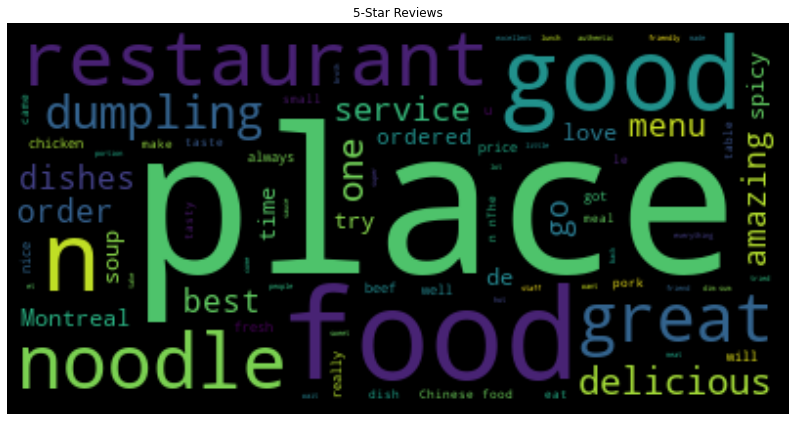

In [86]:
#Display wordcloud for recent 5 star reviews
default_colors = wc_5_recent.to_array()
plt.figure(figsize=(14,12))
plt.title("5-Star Reviews")
plt.imshow(default_colors, interpolation="bilinear")
plt.axis("off")
plt.show()

In [87]:
#create a wordcloud for 1 star reviews from after 2016
wc_1_recent = WordCloud(stopwords=stopwords, margin=10, background_color="black").generate(text_reviews_1_recent)

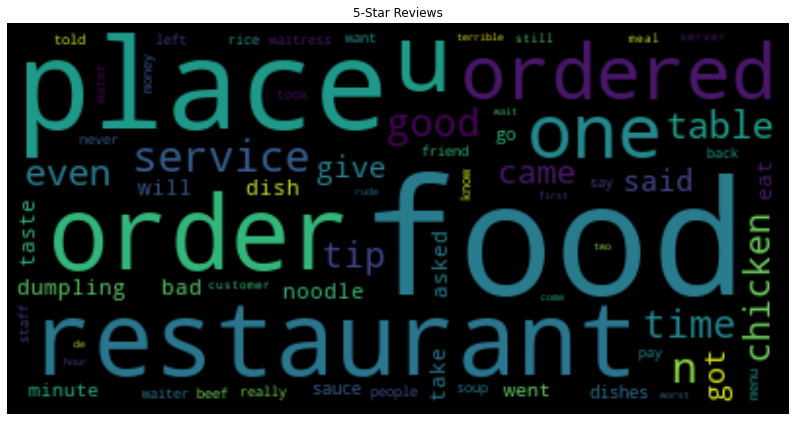

In [88]:
#Display wordcloud for recent 5 star reviews
default_colors = wc_1_recent.to_array()
plt.figure(figsize=(14,12))
plt.title("5-Star Reviews")
plt.imshow(default_colors, interpolation="bilinear")
plt.axis("off")
plt.show()

## Section 11: Creating n-grams for recent 5-stars

### Section 11a: Create a counter for recent 5-star reviews

In [95]:
#tokenize text  for 5 star recents
tokens_5_recent = [w for w in nltk.word_tokenize(text_reviews_5_recent.lower())
 if w.isalpha()]

In [98]:
#remove new stop words
no_stops_5_recent= [t for t in tokens_5_recent 
 if t not in cachedStopWords]

In [99]:
#show 20 most common words
Counter(no_stops_5_recent).most_common(20)

[('food', 1256),
 ('good', 804),
 ('great', 723),
 ('dumplings', 617),
 ('service', 561),
 ('noodles', 552),
 ('delicious', 487),
 ('best', 451),
 ('soup', 439),
 ('back', 385),
 ('pork', 380),
 ('beef', 377),
 ('also', 362),
 ('time', 350),
 ('like', 349),
 ('amazing', 343),
 ('get', 335),
 ('chicken', 329),
 ('would', 327),
 ('menu', 321)]

In [100]:
#create a bigram
bigrams = ngrams(no_stops_5_recent, 2)
Counter(bigrams).most_common(20)

[(('dim', 'sum'), 161),
 (('come', 'back'), 100),
 (('highly', 'recommend'), 87),
 (('fried', 'rice'), 79),
 (('noodle', 'soup'), 75),
 (('food', 'great'), 60),
 (('soup', 'dumplings'), 57),
 (('great', 'food'), 56),
 (('food', 'good'), 54),
 (('first', 'time'), 54),
 (('great', 'service'), 52),
 (('good', 'food'), 48),
 (('general', 'tao'), 47),
 (('would', 'definitely'), 44),
 (('service', 'great'), 43),
 (('ginger', 'beef'), 43),
 (('next', 'time'), 43),
 (('best', 'food'), 41),
 (('would', 'recommend'), 39),
 (('beef', 'noodle'), 38)]

### Section 11b: Create a counter using lemmatizing for 5-star reviews recent

In [101]:
#create lemmatized_5
wordnet_lemmatizer = WordNetLemmatizer()
lemmatized_5_recent = [wordnet_lemmatizer.lemmatize(t) for t in no_stops_5_recent]

In [102]:
#create counter
text_bow_5 = Counter(lemmatized_5_recent)
text_bow_5.most_common(20)

[('food', 1276),
 ('noodle', 817),
 ('good', 807),
 ('dumpling', 735),
 ('great', 723),
 ('service', 573),
 ('dish', 525),
 ('delicious', 488),
 ('soup', 477),
 ('time', 458),
 ('best', 451),
 ('back', 386),
 ('pork', 380),
 ('beef', 377),
 ('also', 362),
 ('get', 358),
 ('like', 352),
 ('amazing', 343),
 ('menu', 334),
 ('chicken', 330)]

In [103]:
#create text chart
text_chart_5_recent = pd.DataFrame(text_bow_5.most_common(20), columns = ['word', 'freq'])
text_chart_5_recent

,word,freq
0,food,1276
1,noodle,817
2,good,807
3,dumpling,735
4,great,723
5,service,573
6,dish,525
7,delicious,488
8,soup,477
9,time,458


In [104]:
#create bi-gram
bigrams_lem_5 = ngrams(lemmatized_5_recent, 2)
Counter(bigrams_lem_5).most_common(20)

[(('dim', 'sum'), 163),
 (('come', 'back'), 101),
 (('noodle', 'soup'), 97),
 (('highly', 'recommend'), 87),
 (('fried', 'rice'), 79),
 (('soup', 'dumpling'), 63),
 (('food', 'great'), 61),
 (('food', 'good'), 56),
 (('great', 'food'), 56),
 (('first', 'time'), 54),
 (('great', 'service'), 52),
 (('beef', 'noodle'), 49),
 (('good', 'food'), 48),
 (('general', 'tao'), 47),
 (('service', 'great'), 45),
 (('would', 'definitely'), 44),
 (('spring', 'roll'), 44),
 (('next', 'time'), 44),
 (('ginger', 'beef'), 43),
 (('best', 'food'), 42)]

In [105]:
#create trigram
trigrams_lem_5_recent = ngrams(lemmatized_5_recent, 3)
Counter(trigrams_lem_5_recent).most_common(20)

[(('hand', 'pulled', 'noodle'), 29),
 (('definitely', 'come', 'back'), 26),
 (('beef', 'noodle', 'soup'), 22),
 (('hot', 'sour', 'soup'), 21),
 (('would', 'definitely', 'come'), 19),
 (('general', 'tao', 'chicken'), 19),
 (('dan', 'dan', 'noodle'), 18),
 (('would', 'definitely', 'recommend'), 16),
 (('black', 'bean', 'sauce'), 15),
 (('would', 'highly', 'recommend'), 13),
 (('ca', 'wait', 'back'), 12),
 (('sweet', 'sour', 'pork'), 12),
 (('food', 'great', 'service'), 12),
 (('best', 'dim', 'sum'), 10),
 (('great', 'dim', 'sum'), 10),
 (('peanut', 'butter', 'dumpling'), 10),
 (('back', 'next', 'time'), 10),
 (('food', 'good', 'service'), 9),
 (('peanut', 'butter', 'sauce'), 9),
 (('would', 'come', 'back'), 9)]

## Section 12: Create n-grams for 1-star reviews recent

### Section 12a: Create a counter for 1-star reviews recent

In [106]:
#tokenize text
tokens_1_recent = [w for w in nltk.word_tokenize(text_reviews_1_recent.lower())
 if w.isalpha()]

In [107]:
#remove new stop words
no_stops_1_recent = [t for t in tokens_1_recent
 if t not in cachedStopWords]

In [108]:
#show 20 most common words
Counter(no_stops_1_recent).most_common(20)

[('food', 818),
 ('service', 366),
 ('us', 341),
 ('ordered', 306),
 ('order', 303),
 ('like', 263),
 ('time', 261),
 ('chicken', 255),
 ('would', 247),
 ('even', 233),
 ('good', 232),
 ('never', 220),
 ('back', 218),
 ('bad', 193),
 ('get', 177),
 ('got', 176),
 ('table', 164),
 ('said', 161),
 ('asked', 157),
 ('rice', 151)]

In [109]:
#create a bigram
bigrams = ngrams(no_stops_1_recent, 2)
Counter(bigrams).most_common(20)

[(('fried', 'rice'), 41),
 (('dim', 'sum'), 37),
 (('customer', 'service'), 34),
 (('general', 'tao'), 33),
 (('first', 'time'), 31),
 (('tasted', 'like'), 31),
 (('chow', 'mein'), 30),
 (('food', 'good'), 28),
 (('ginger', 'beef'), 27),
 (('would', 'recommend'), 27),
 (('worst', 'food'), 27),
 (('come', 'back'), 24),
 (('quality', 'food'), 22),
 (('wonton', 'soup'), 22),
 (('last', 'time'), 22),
 (('spring', 'rolls'), 21),
 (('waste', 'money'), 21),
 (('somewhere', 'else'), 21),
 (('bad', 'service'), 21),
 (('going', 'back'), 21)]

### Section 12b: Create a counter using lemmatizing for 1-star reviews recent

In [110]:
#create lemmatized_1
wordnet_lemmatizer = WordNetLemmatizer()
lemmatized_1_recent = [wordnet_lemmatizer.lemmatize(t) for t in no_stops_1_recent]

In [111]:
#create counter
text_bow_1 = Counter(lemmatized_1_recent)
text_bow_1.most_common(20)

[('food', 830),
 ('service', 376),
 ('u', 351),
 ('order', 334),
 ('time', 324),
 ('ordered', 306),
 ('like', 265),
 ('chicken', 256),
 ('dish', 253),
 ('would', 247),
 ('even', 233),
 ('good', 232),
 ('never', 220),
 ('back', 218),
 ('table', 210),
 ('bad', 193),
 ('dumpling', 185),
 ('get', 180),
 ('tip', 177),
 ('got', 176)]

In [112]:
text_chart_1_recent = pd.DataFrame(text_bow_1.most_common(20), columns = ['word', 'freq'])
text_chart_1_recent

,word,freq
0,food,830
1,service,376
2,u,351
3,order,334
4,time,324
5,ordered,306
6,like,265
7,chicken,256
8,dish,253
9,would,247


In [113]:
bigrams_lem_1 = ngrams(lemmatized_1_recent, 2)
Counter(bigrams_lem_1).most_common(20)

[(('fried', 'rice'), 42),
 (('dim', 'sum'), 39),
 (('customer', 'service'), 35),
 (('general', 'tao'), 33),
 (('first', 'time'), 31),
 (('tasted', 'like'), 31),
 (('chow', 'mein'), 30),
 (('come', 'back'), 28),
 (('food', 'good'), 28),
 (('spring', 'roll'), 27),
 (('ginger', 'beef'), 27),
 (('would', 'recommend'), 27),
 (('worst', 'food'), 27),
 (('taste', 'like'), 25),
 (('wonton', 'soup'), 25),
 (('last', 'time'), 24),
 (('quality', 'food'), 22),
 (('bad', 'service'), 22),
 (('waste', 'money'), 21),
 (('somewhere', 'else'), 21)]

In [114]:
#create trigram
trigrams_lem_1_recent = ngrams(lemmatized_1_recent, 3)
Counter(trigrams_lem_1_recent).most_common(20)

[(('general', 'tao', 'chicken'), 15),
 (('chicken', 'fried', 'rice'), 13),
 (('waste', 'time', 'money'), 12),
 (('never', 'going', 'back'), 10),
 (('hot', 'sour', 'soup'), 10),
 (('xiao', 'long', 'bao'), 8),
 (('food', 'good', 'service'), 8),
 (('sweet', 'sour', 'pork'), 7),
 (('never', 'coming', 'back'), 7),
 (('peanut', 'butter', 'dumpling'), 6),
 (('horrible', 'customer', 'service'), 6),
 (('probably', 'worst', 'food'), 6),
 (('chicken', 'chow', 'mein'), 6),
 (('never', 'come', 'back'), 5),
 (('salt', 'pepper', 'shrimp'), 5),
 (('could', 'star', 'would'), 5),
 (('bad', 'customer', 'service'), 5),
 (('food', 'terrible', 'service'), 5),
 (('would', 'recommend', 'anyone'), 4),
 (('wo', 'come', 'back'), 4)]

### Section 13: Create a Dataframe for tri-grams 

### Subsection 13a: Create a Dataframe for tri-grams for 5-star and 1-star for recent

In [115]:
#Create df trigrams for 1 star
df_trigram_1_recent = (pd.Series(nltk.ngrams(lemmatized_1_recent, 3)).value_counts())
df_trigram_1_recent = pd.DataFrame(df_trigram_1_recent).reset_index()
df_trigram_1_recent.rename(columns={'index': 'word_1_recent', 0:'freq_1_recent'},inplace=True)
df_trigram_1_recent = df_trigram_1_recent.head(20)
df_trigram_1_recent

,word_1_recent,freq_1_recent
0,"(general, tao, chicken)",15
1,"(chicken, fried, rice)",13
2,"(waste, time, money)",12
3,"(never, going, back)",10
4,"(hot, sour, soup)",10
5,"(food, good, service)",8
6,"(xiao, long, bao)",8
7,"(sweet, sour, pork)",7
8,"(never, coming, back)",7
9,"(probably, worst, food)",6


In [116]:
#create df trigram for 5 star
df_trigram_5_recent = (pd.Series(nltk.ngrams(lemmatized_5_recent, 3)).value_counts())
df_trigram_5_recent = pd.DataFrame(df_trigram_5_recent).reset_index()
df_trigram_5_recent.rename(columns={'index': 'word_5_recent', 0:'freq_5_recent'},inplace=True)
df_trigram_5_recent = df_trigram_5_recent.head(20)
df_trigram_5_recent

,word_5_recent,freq_5_recent
0,"(hand, pulled, noodle)",29
1,"(definitely, come, back)",26
2,"(beef, noodle, soup)",22
3,"(hot, sour, soup)",21
4,"(would, definitely, come)",19
5,"(general, tao, chicken)",19
6,"(dan, dan, noodle)",18
7,"(would, definitely, recommend)",16
8,"(black, bean, sauce)",15
9,"(would, highly, recommend)",13


In [117]:
#concatenate df trigram 1 and 5
df_trigram_recent = pd.concat((df_trigram_1_recent, df_trigram_5_recent), axis=1)
df_trigram_recent

,word_1_recent,freq_1_recent,word_5_recent,freq_5_recent
0,"(general, tao, chicken)",15,"(hand, pulled, noodle)",29
1,"(chicken, fried, rice)",13,"(definitely, come, back)",26
2,"(waste, time, money)",12,"(beef, noodle, soup)",22
3,"(never, going, back)",10,"(hot, sour, soup)",21
4,"(hot, sour, soup)",10,"(would, definitely, come)",19
5,"(food, good, service)",8,"(general, tao, chicken)",19
6,"(xiao, long, bao)",8,"(dan, dan, noodle)",18
7,"(sweet, sour, pork)",7,"(would, definitely, recommend)",16
8,"(never, coming, back)",7,"(black, bean, sauce)",15
9,"(probably, worst, food)",6,"(would, highly, recommend)",13


### Subsection 13b: Concatenate recent and all review df

In [118]:
#concatenate df trigram 1 and 5
df_trigram_all = pd.concat((df_trigram, df_trigram_recent), axis=1)
df_trigram_all

,word_1,freq_1,word_5,freq_5,word_1_recent,freq_1_recent,word_5_recent,freq_5_recent
0,"(could, star, would)",7,"(great, food, great)",16,"(general, tao, chicken)",15,"(hand, pulled, noodle)",29
1,"(worst, dim, sum)",5,"(food, great, service)",12,"(chicken, fried, rice)",13,"(definitely, come, back)",26
2,"(absolutely, worst, food)",4,"(best, thai, food)",9,"(waste, time, money)",12,"(beef, noodle, soup)",22
3,"(food, bad, service)",4,"(hand, pulled, noodle)",9,"(never, going, back)",10,"(hot, sour, soup)",21
4,"(chicken, fried, rice)",4,"(best, dim, sum)",9,"(hot, sour, soup)",10,"(would, definitely, come)",19
5,"(worst, service, food)",3,"(love, love, love)",8,"(food, good, service)",8,"(general, tao, chicken)",19
6,"(got, sick, eating)",3,"(great, dim, sum)",8,"(xiao, long, bao)",8,"(dan, dan, noodle)",18
7,"(worst, customer, service)",3,"(general, tao, chicken)",8,"(sweet, sour, pork)",7,"(would, definitely, recommend)",16
8,"(general, tao, chicken)",3,"(xiao, long, bao)",7,"(never, coming, back)",7,"(black, bean, sauce)",15
9,"(food, good, service)",3,"(food, great, price)",6,"(probably, worst, food)",6,"(would, highly, recommend)",13


In [119]:
#Reorder columns
df_trigram_all_words = df_trigram_all[["word_1","word_1_recent","word_5","word_5_recent"]]
df_trigram_all_words

,word_1,word_1_recent,word_5,word_5_recent
0,"(could, star, would)","(general, tao, chicken)","(great, food, great)","(hand, pulled, noodle)"
1,"(worst, dim, sum)","(chicken, fried, rice)","(food, great, service)","(definitely, come, back)"
2,"(absolutely, worst, food)","(waste, time, money)","(best, thai, food)","(beef, noodle, soup)"
3,"(food, bad, service)","(never, going, back)","(hand, pulled, noodle)","(hot, sour, soup)"
4,"(chicken, fried, rice)","(hot, sour, soup)","(best, dim, sum)","(would, definitely, come)"
5,"(worst, service, food)","(food, good, service)","(love, love, love)","(general, tao, chicken)"
6,"(got, sick, eating)","(xiao, long, bao)","(great, dim, sum)","(dan, dan, noodle)"
7,"(worst, customer, service)","(sweet, sour, pork)","(general, tao, chicken)","(would, definitely, recommend)"
8,"(general, tao, chicken)","(never, coming, back)","(xiao, long, bao)","(black, bean, sauce)"
9,"(food, good, service)","(probably, worst, food)","(food, great, price)","(would, highly, recommend)"


## Explain the results

- when we checked the reviwes in the first we discover some reviews have some french words.

 - to avoid stop words we have to inculde both French and english stop words.
 
 
 
- updateding unuseful stop words like ('one','really','ever','chinese','restaurant','go','came','give','place','star','zero') not have enough info.


- words like 'noodles' and 'dumpling'are helpful to know what people likes and make them give 5 star food in the genrel was the key word.


-  in the the one star most common words we can say worse,horrible and service. 


- going through the bigram and trigram we know the problem the customer had bad service experince and bad food quality.


- filter on the year to see the most recent reviews help alot with what the cusomer excpecting.


- In 5 star recent reviews wasn't much diffrent still people like same dishes and good service as well.


- in 1 star recent reviews  people still complain about the service for example trigram of (horrible, customer, service) and also they complian about some dishes. 	